### Interpretability of U-Net: Visualization of extreme events

In [1]:
### In this jupyter notebook, we compare the results from different LRP's methods to explain the predictions of two extremes, in 2018 and 2021.
### In addition, we analyse the corresponding baselines (when passing zeros through the network)
### NOTE: the LRP has been only applied to the U-Net architectures

In [48]:
# Important to note:!
# The use of innvestigate requires specific versions of python and keras
# The model must be built according to the versions, so the weights are saved separately
# import necesssary libaries
from pathlib import Path
import pathlib
import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import pandas as pd
import seaborn as sns
#for plotting
import geopandas as gpd

from keras.models import load_model
from keras.preprocessing.image import ImageDataGenerator

from utils.utils_unet import *
from utils.utils_plot import *
from utils.DNN_models import *
from utils.utils_LRP import *


import innvestigate
import innvestigate.utils as iutils
import innvestigate.applications.imagenet
import innvestigate.utils.visualizations as ivis

import warnings
with warnings.catch_warnings():
    warnings.simplefilter('ignore')  #catch FutureWarnings so that I can find actual errors!
    
    import keras
    import keras.backend as K
    import keras.models
    #import tensorflow as tf  # this is new for custom loss function
    from keras.models import load_model
    
    from keras.layers import Input, Dense, Activation, Dropout, Flatten, MaxPooling2D, Conv2D, Conv2DTranspose, UpSampling2D, Reshape
    from keras.models import Model
    
    from keras.utils import CustomObjectScope
    from keras.initializers import glorot_uniform

In [49]:
import yaml
conf = yaml.safe_load(open("config.yaml"))

In [50]:
#DIR_WEIGHTS = 'tmp/Keras_Baseline/'
DIR_WEIGHTS = '/storage/homefs/no21h426/precip-predict/tmp/keras/'

In [51]:
# load data
# coordinates
lons_x = np.load('tmp/data/lons_y.npy')
lats_y = np.load('tmp/data/lats_y.npy')

In [52]:
# test-times
times = np.arange(np.datetime64('2016-01-01'), np.datetime64('2021-12-31'))
times = pd.to_datetime(times)
# load the training and testing data
dg_test_Y_xtrm = np.array(xr.open_dataarray('tmp/data/dg_test_Y_xtrm0.95th.nc'))
dg_test_X = np.array(xr.open_dataarray('tmp/data/dg_test_X.nc'))
dg_test_X_zeros = np.zeros_like(dg_test_X, dtype=float) # just for testing purposes regarding the baseline


In [53]:
#load predictions --numpy array
y_pred1_test = np.load('tmp/data/y_pred_test_UNET10.95th.npy')
y_pred4_test = np.load('tmp/data/y_pred_test_UNET40.95th.npy')
y_pred1_bool = y_pred1_test >= 0.5
y_pred1_bool = y_pred1_bool * 1
y_pred4_bool = y_pred4_test >= 0.5
y_pred4_bool = y_pred4_bool * 1

### Visualize events to analyse

In [54]:
#select one day # e.g. select the flood in July 2021, days: 12-15
idx = np.where(times == '2021-07-14')

In [55]:
idx = int(idx[0])

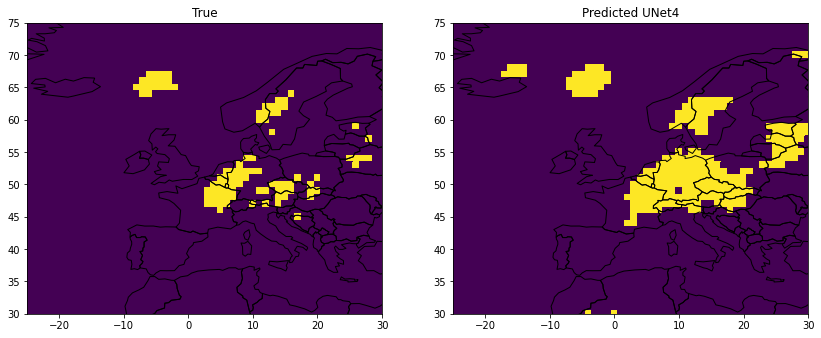

In [56]:
#select one day and plot
fig, ax = plt.subplots(figsize=(14, 8), ncols=2, nrows=1)
plot_map(ax[0], lons_x, lats_y, dg_test_Y_xtrm[idx,:,:,0], title="True", vmin=0, vmax=1,  show_colorbar=False)
plot_map(ax[1], lons_x, lats_y, y_pred4_bool[idx,:,:], title="Predicted UNet4", vmin=0, vmax=1, show_colorbar=False)

In [57]:
fig.savefig('figures/14July2021_predicted_true_nocolorbar.pdf')

In [58]:
# As in the main notebook, also analyse the day with the highest amoung of observed precipitation (it corresponds to Hurricane Leslie that evolved to storms-reported heavy precipitation
# Get the index of the max # of extremes
i_max_obs = np.argmax(np.sum(dg_test_Y_xtrm, axis=(1,2)))

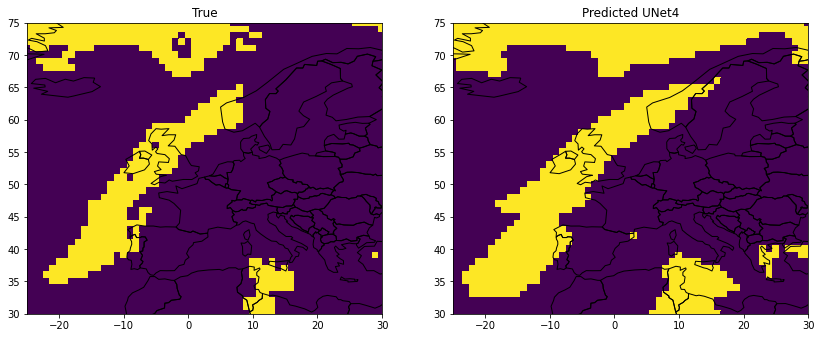

In [59]:
#select one day and plot
fig, ax = plt.subplots(figsize=(14, 8), ncols=2, nrows=1)
plot_map(ax[0], lons_x, lats_y, dg_test_Y_xtrm[i_max_obs,:,:,0], title="True", vmin=0, vmax=1,  show_colorbar=False)
plot_map(ax[1], lons_x, lats_y, y_pred4_bool[i_max_obs,:,:], title="Predicted UNet4", vmin=0, vmax=1, show_colorbar=False)

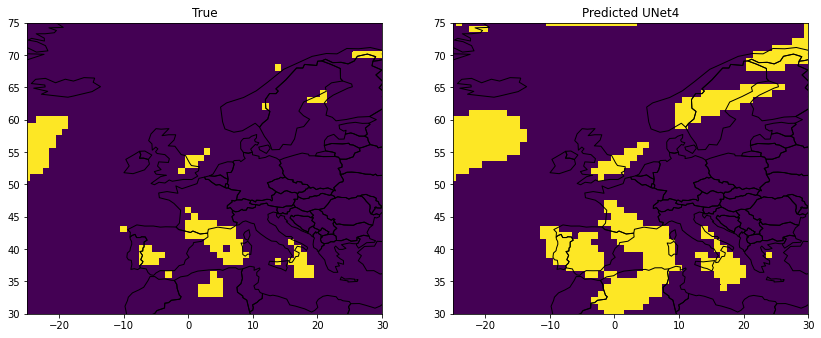

In [60]:
fig, ax = plt.subplots(figsize=(14, 8), ncols=2, nrows=1)
plot_map(ax[0], lons_x, lats_y, dg_test_Y_xtrm[i_max_obs +2 ,:,:,0], title="True", vmin=0, vmax=1,  show_colorbar=False)
plot_map(ax[1], lons_x, lats_y, y_pred4_bool[i_max_obs +2 ,:,:], title="Predicted UNet4", vmin=0, vmax=1, show_colorbar=False)

In [61]:
nx = dg_test_X.shape[1]
ny = dg_test_X.shape[2]
nchans = dg_test_X.shape[3]

In [62]:
i_max_obs=1016

In [63]:
times[i_max_obs]

Timestamp('2018-10-13 00:00:00')

In [64]:
i_shape = conf['i_shape']
o_shape = conf['o_shape']

print(f'X shape: {i_shape}')
print(f'y shape: {o_shape}')
output_channels = conf['output_channels']
num_filters = conf['num_filters']
use_batchnorm = conf['use_batchnorm']
dropout = conf['dropout']
lr = conf['lr']

name_model = conf['model']
output_scaling = 1
output_crop = None


# Define hyperparameters
EPOCHS = 10
LR_METHOD = 'Constant'  # Cyclical, CosineDecay, Constant
                                            
# Default model options
opt_model = {'latent_dim': 128,
             'dropout_rate': 0.2}

# Default optimizer options
opt_optimizer = {'lr_method': 'Constant',
                 'lr': 0.0004,
                 'init_lr': 0.01}

models_unets = {
          'UNET1': {'model': 'Unet', 'run': True,
                   'opt_model': {'output_scaling': output_scaling, 'output_crop': output_crop, 'unet_depth': 1, 'use_upsample': False},
                   'opt_optimizer': {'lr_method': 'Constant'}},
          'UNET2': {'model': 'Unet', 'run': True,
                   'opt_model': {'output_scaling': output_scaling, 'output_crop': output_crop, 'unet_depth': 2, 'use_upsample': False},
                   'opt_optimizer': {'lr_method': 'Constant'}},
          'UNET3': {'model': 'Unet', 'run': True,
                   'opt_model': {'output_scaling': output_scaling, 'output_crop': output_crop, 'unet_depth': 3, 'use_upsample': False},
                   'opt_optimizer': {'lr_method': 'Constant'}},
          'UNET4': {'model': 'Unet', 'run': True,
                   'opt_model': {'output_scaling': output_scaling, 'output_crop': output_crop, 'unet_depth': 4, 'use_upsample': False},
                   'opt_optimizer': {'lr_method': 'Constant'}},
         }

X shape: [46, 56, 31]
y shape: [46, 56, 1]


In [65]:
models = models_unets

In [66]:
models_prec =[]
models_xtrm = []

In [67]:
# load weights
for m_id in models:
    
    if not models[m_id]['run']:
        continue
    print(m_id)
    # Extract model name and options
    model = models[m_id]['model']
    opt_model_i = models[m_id]['opt_model']
    opt_optimizer_i = models[m_id]['opt_optimizer']
    opt_model_new = opt_model.copy()
    opt_model_new.update(opt_model_i)
    opt_optimizer_new = opt_optimizer.copy()
    opt_optimizer_new.update(opt_optimizer_i)

    m = DeepFactory_Keras(model, i_shape, o_shape, for_extremes=False, for_lrp = True, **opt_model_new)
    m.model.load_weights(f'{DIR_WEIGHTS}ERA5-low_0.95_{m_id}.h5')
    
    #m_prec = DeepFactory_Keras(model, i_shape, o_shape, for_extremes=False,  for_lrp = True, **opt_model_new)
    # compile 
    #m_prec.model.compile(loss='mse',  metrics=['mse'],  optimizer='adam')
    print('loads weigths')
    #m.model.summary()
    # load weights
    #print("loading weights for",m_id)
    #m_prec.model.load_weights(f'{DIR_WEIGHTS}ERA5-low_0.95_{m_id}.h5')
    
    models_prec.append(m)


UNET1
loads weigths
UNET2
loads weigths
UNET3
loads weigths
UNET4
loads weigths


In [68]:
# load for extremes
# load weights
for m_id in models:
    
    if not models[m_id]['run']:
        continue
    print(m_id)
    # Extract model name and options
    model = models[m_id]['model']
    opt_model_i = models[m_id]['opt_model']
    opt_optimizer_i = models[m_id]['opt_optimizer']
    opt_model_new = opt_model.copy()
    opt_model_new.update(opt_model_i)
    opt_optimizer_new = opt_optimizer.copy()
    opt_optimizer_new.update(opt_optimizer_i)

    m = DeepFactory_Keras(model, i_shape, o_shape, for_extremes=True, for_lrp = True, **opt_model_new)
    m.model.load_weights(f'{DIR_WEIGHTS}ERA5-low_0.95_{m_id}_xtrm.h5')
    
    #m_prec = DeepFactory_Keras(model, i_shape, o_shape, for_extremes=False,  for_lrp = True, **opt_model_new)
    # compile 
    #m_prec.model.compile(loss='mse',  metrics=['mse'],  optimizer='adam')
    print('loads weigths for extremes')
    #m.model.summary()
    # load weights
    #print("loading weights for",m_id)
    #m_prec.model.load_weights(f'{DIR_WEIGHTS}ERA5-low_0.95_{m_id}.h5')
    
    models_xtrm.append(m)

UNET1
loads weigths for extremes
UNET2
loads weigths for extremes
UNET3
loads weigths for extremes
UNET4
loads weigths for extremes


In [69]:
# 2021 event

In [25]:
# LRPcomposite

In [70]:
rel_UNET1_2021= calLRP(dg_test_X[idx-1:idx+2,:,:,:],models_prec[0].model, 'comp', only_positive=False )
rel_UNET2_2021= calLRP(dg_test_X[idx-1:idx+2,:,:,:],models_prec[1].model, 'comp', only_positive=False )
rel_UNET3_2021= calLRP(dg_test_X[idx-1:idx+2,:,:,:],models_prec[2].model, 'comp', only_positive=False )
rel_UNET4_2021= calLRP(dg_test_X[idx-1:idx+2,:,:,:],models_prec[3].model, 'comp', only_positive=False )

In [71]:
print(rel_UNET1_2021.max(),rel_UNET1_2021.mean(),rel_UNET1_2021.min())
print(rel_UNET2_2021.max(),rel_UNET2_2021.mean(), rel_UNET2_2021.min())
print(rel_UNET3_2021.max(),rel_UNET3_2021.mean(), rel_UNET3_2021.min())
print(rel_UNET4_2021.max(),rel_UNET4_2021.mean(), rel_UNET4_2021.min())

4.171197891235352 0.004047701829388309 0.0
4.0698018074035645 0.009435455677386477 0.0
7.258489608764648 0.027274409936074828 2.0012549839520943e-08
6.721308708190918 0.026385317597194265 5.543544290276259e-08


In [72]:
# Same for the model_xtrm
rel_UNET1_xtrm_2021= calLRP(dg_test_X[idx-1:idx+2,:,:,:],models_xtrm[0].model, 'comp', only_positive=False )
rel_UNET2_xtrm_2021= calLRP(dg_test_X[idx-1:idx+2,:,:,:],models_xtrm[1].model, 'comp', only_positive=False )
rel_UNET3_xtrm_2021= calLRP(dg_test_X[idx-1:idx+2,:,:,:],models_xtrm[2].model, 'comp', only_positive=False )
rel_UNET4_xtrm_2021= calLRP(dg_test_X[idx-1:idx+2,:,:,:],models_xtrm[3].model, 'comp', only_positive=False )

In [35]:
# plot 2021-07-14 , the day of the extreme event!

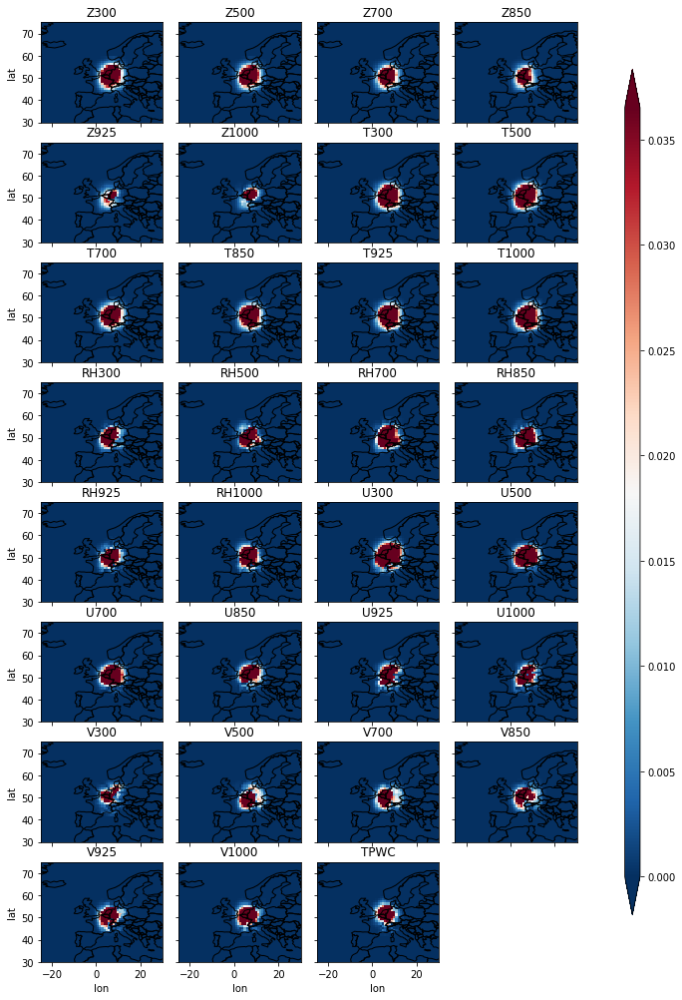

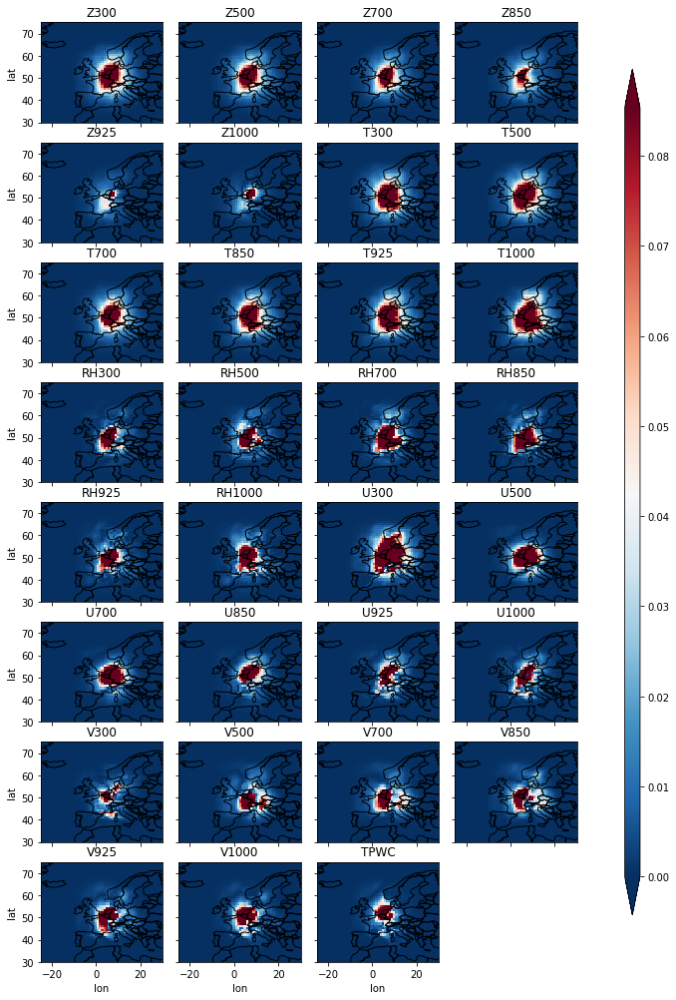

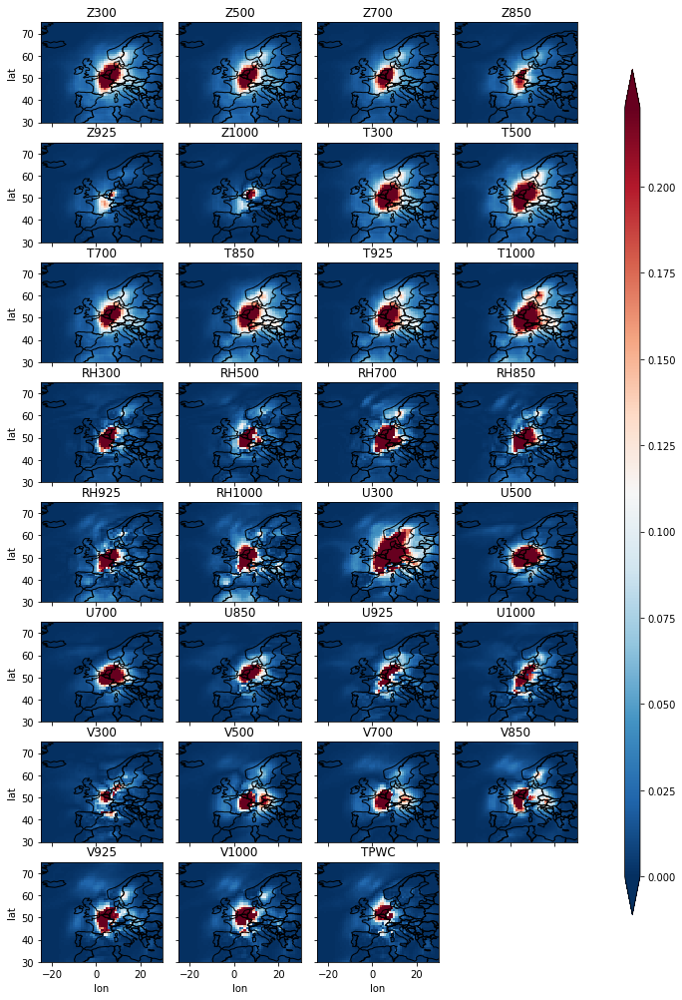

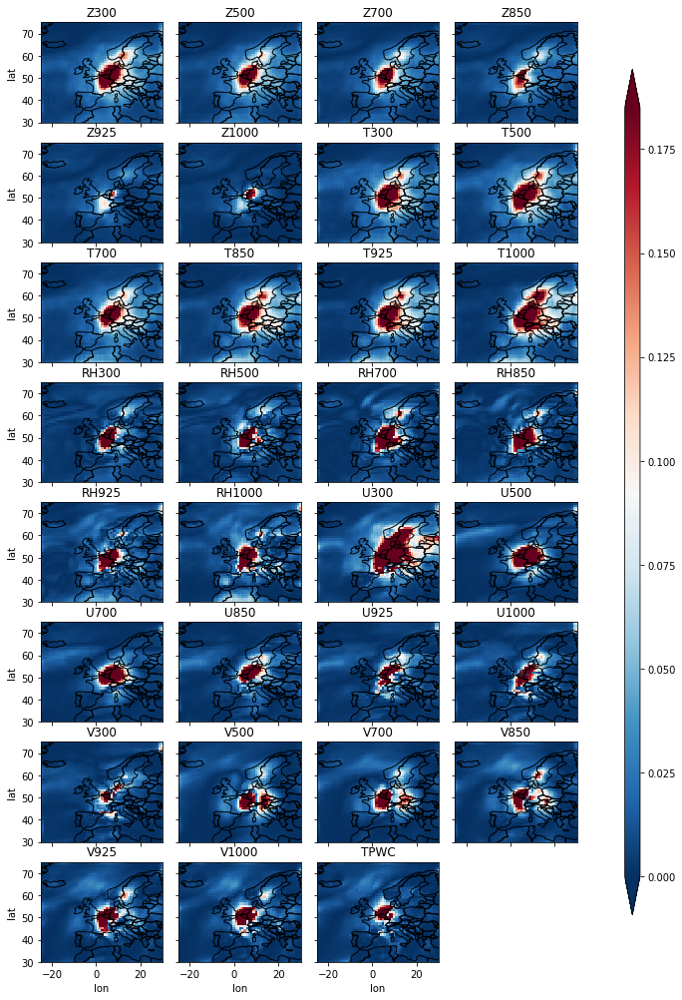

In [75]:
plot_xr_rel(rel_UNET1_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'rel_UNET1_2021', vmin=0, vmax = None, cmap = 'RdBu_r')
plot_xr_rel(rel_UNET2_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'rel_UNET2_2021', vmin=0, vmax = None, cmap = 'RdBu_r')
plot_xr_rel(rel_UNET3_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'rel_UNET3_2021', vmin=0, vmax = None, cmap = 'RdBu_r')
plot_xr_rel(rel_UNET4_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'rel_UNET4_2021', vmin=0, vmax = None, cmap = 'RdBu_r')

In [77]:
## Plot the same but when using the weights from the model_xtrm

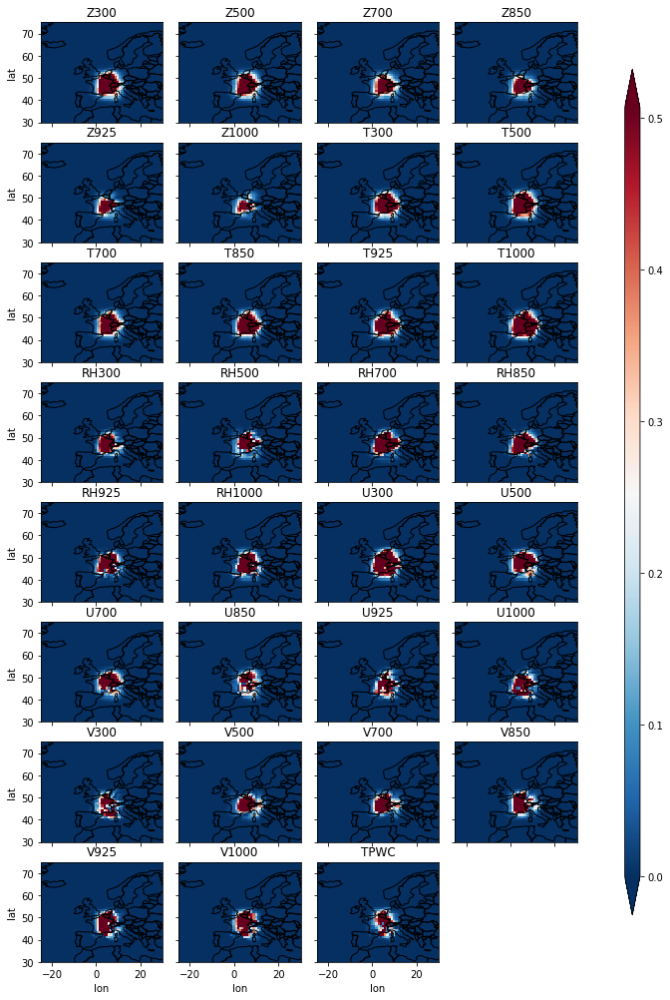

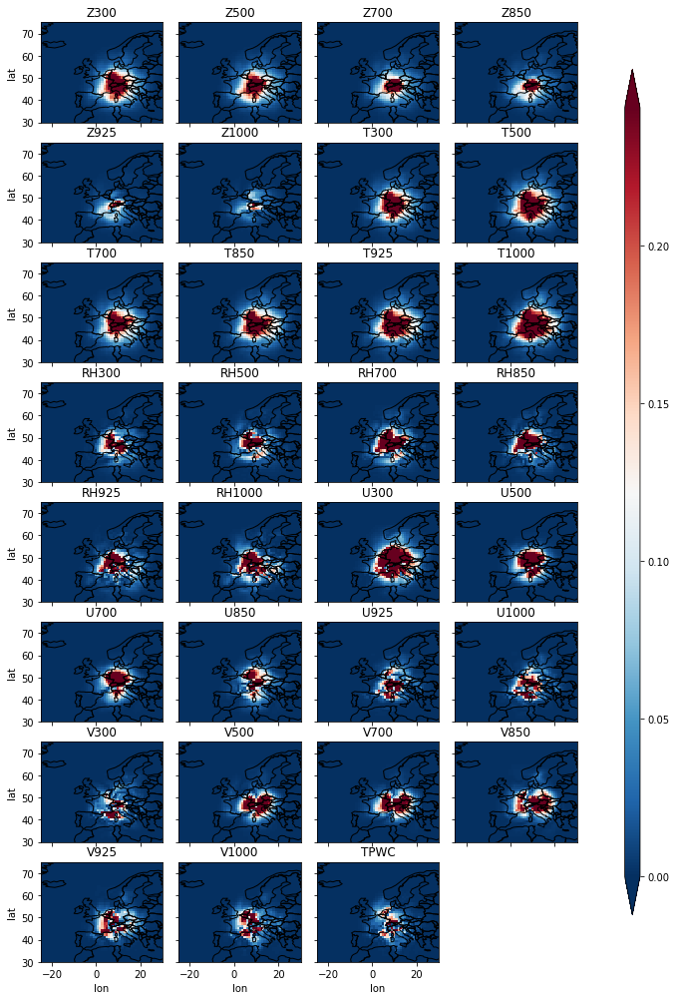

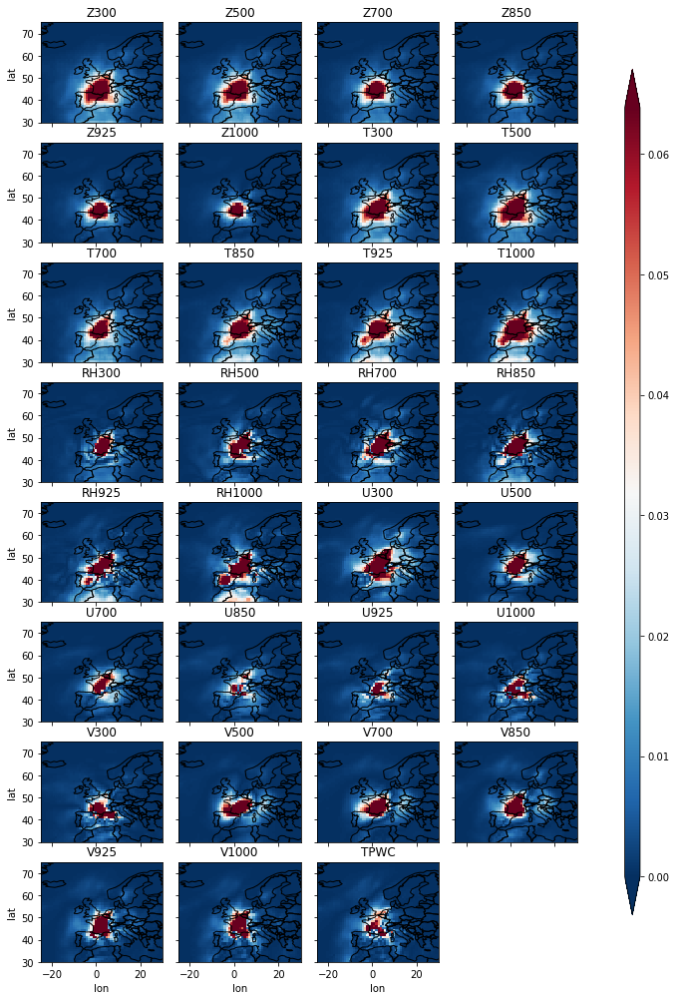

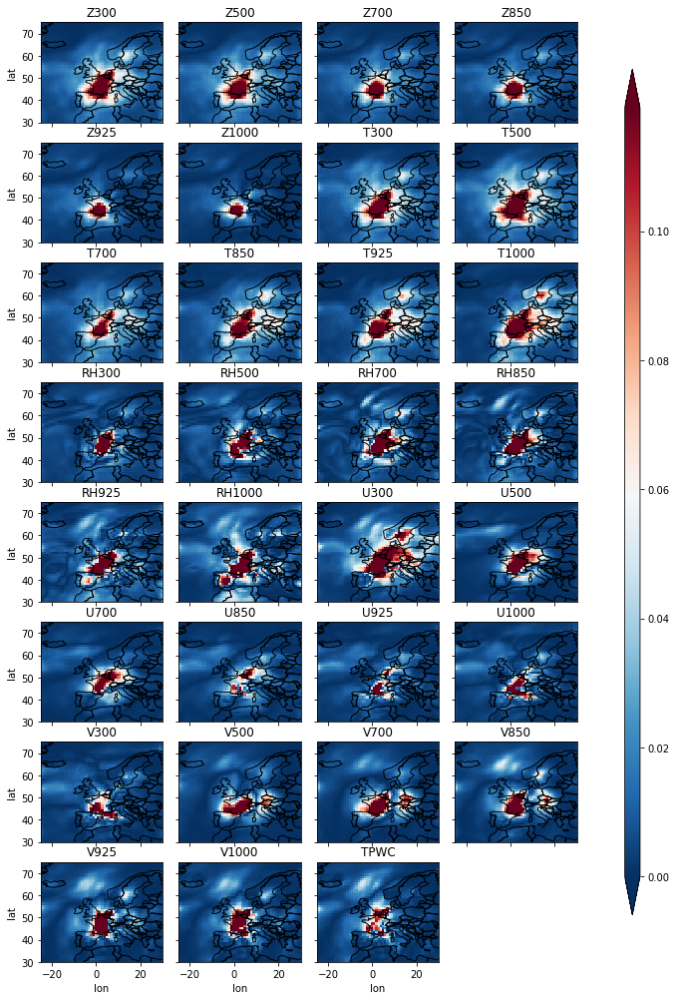

In [78]:
plot_xr_rel(rel_UNET1_xtrm_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'rel_UNET1_xtrm_2021', vmin=0, vmax = None, cmap = 'RdBu_r')
plot_xr_rel(rel_UNET2_xtrm_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'rel_UNET2_xtrm_2021', vmin=0, vmax = None, cmap = 'RdBu_r')
plot_xr_rel(rel_UNET3_xtrm_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'rel_UNET3_xtrm_2021', vmin=0, vmax = None, cmap = 'RdBu_r')
plot_xr_rel(rel_UNET4_xtrm_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'rel_UNET4_xtrm_2021', vmin=0, vmax = None, cmap = 'RdBu_r')

In [37]:
# LRP-Z

In [38]:
rel_lrpz_UNET1_2021= calLRP(dg_test_X[idx-1:idx+2,:,:,:],models_prec[0].model, 'lrpz', only_positive=False )
rel_lrpz_UNET2_2021= calLRP(dg_test_X[idx-1:idx+2,:,:,:],models_prec[1].model, 'lrpz', only_positive=False )
rel_lrpz_UNET3_2021= calLRP(dg_test_X[idx-1:idx+2,:,:,:],models_prec[2].model, 'lrpz', only_positive=False )
rel_lrpz_UNET4_2021= calLRP(dg_test_X[idx-1:idx+2,:,:,:],models_prec[3].model, 'lrpz', only_positive=False )

In [39]:
print(rel_lrpz_UNET1_2021.max(),rel_lrpz_UNET1_2021.mean(),rel_UNET1_2021.min())
print(rel_lrpz_UNET2_2021.max(),rel_lrpz_UNET2_2021.mean(), rel_UNET2_2021.min())
print(rel_lrpz_UNET3_2021.max(),rel_lrpz_UNET3_2021.mean(), rel_UNET3_2021.min())
print(rel_lrpz_UNET4_2021.max(),rel_lrpz_UNET4_2021.mean(), rel_UNET4_2021.min())

3062.439208984375 -0.0030160854502952763 0.0
1377.082275390625 0.007603410366959089 0.0
95064.2890625 0.18131881473117523 1.1665772348123937e-08
89631496.0 -17.25120218207827 1.962819453638076e-07


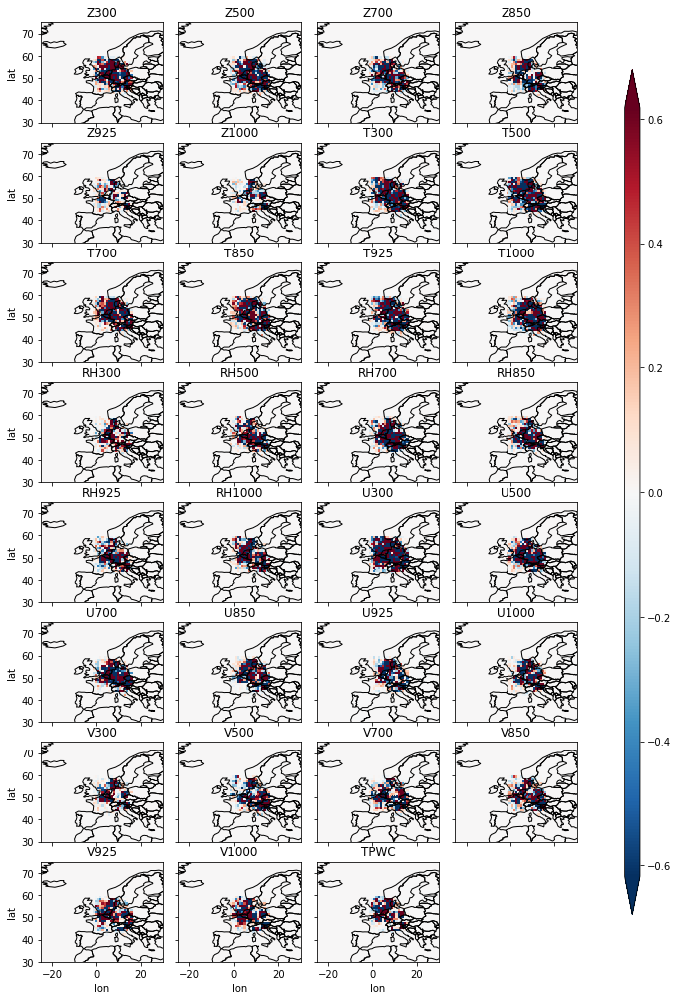

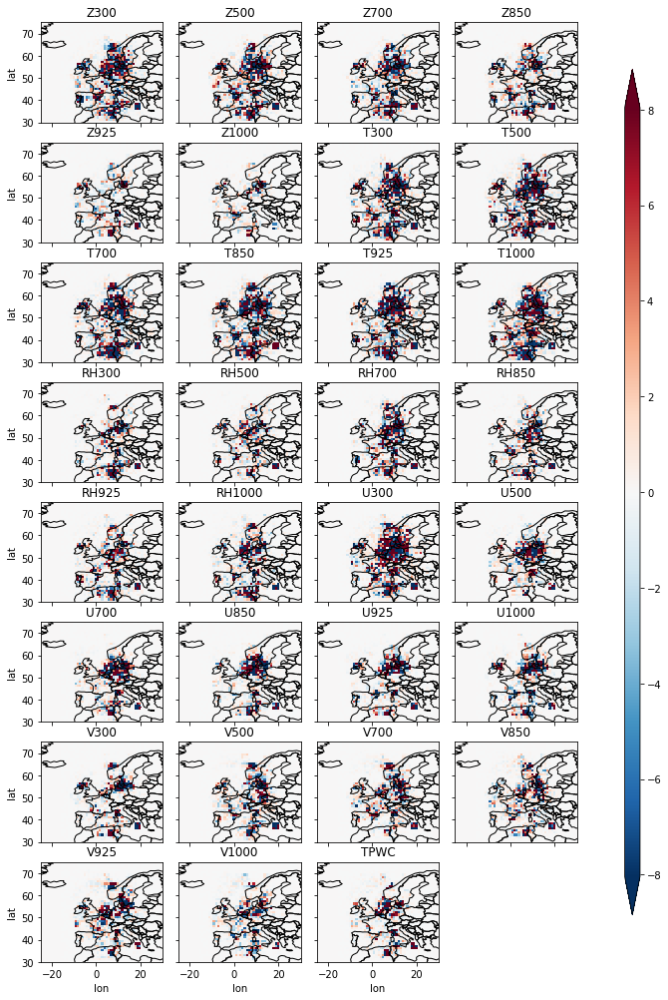

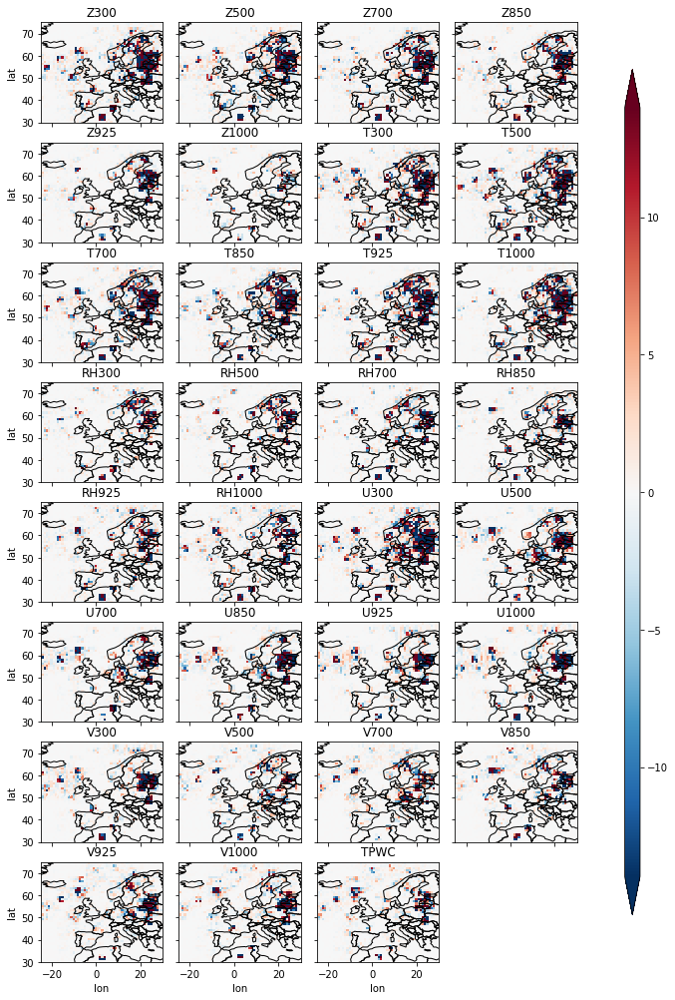

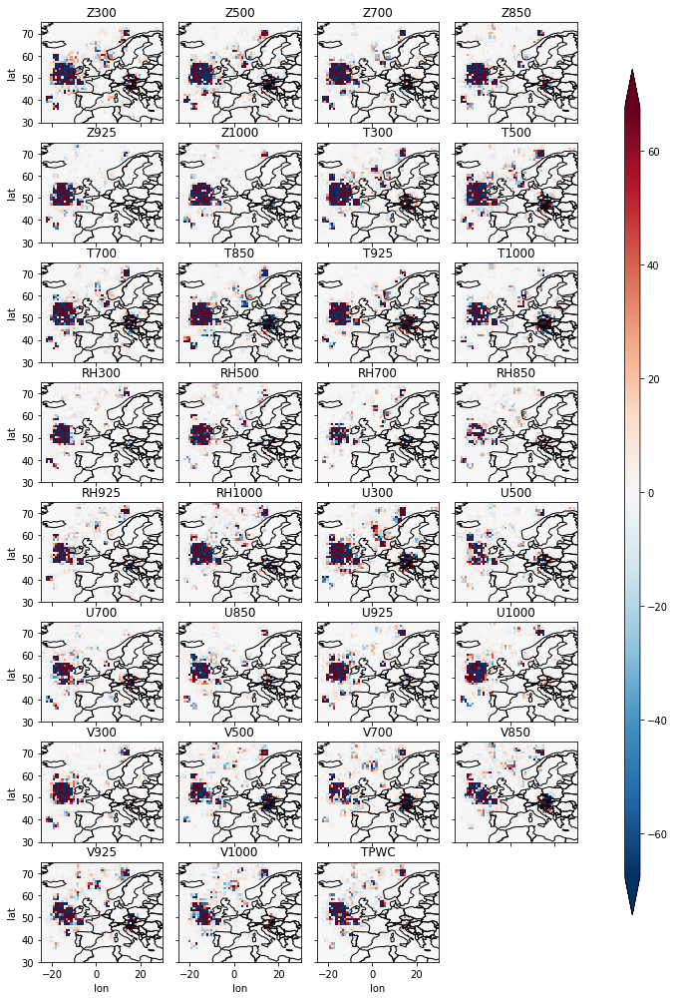

In [40]:
plot_xr_rel(rel_lrpz_UNET1_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'rel_lrpz_UNET1_2021', vmin=None, vmax = None, cmap = 'RdBu_r')
plot_xr_rel(rel_lrpz_UNET2_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'rel_lrpz_UNET2_2021', vmin=None, vmax = None, cmap = 'RdBu_r')
plot_xr_rel(rel_lrpz_UNET3_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'rel_lrpz_UNET3_2021', vmin=None, vmax = None, cmap = 'RdBu_r')
plot_xr_rel(rel_lrpz_UNET4_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'rel_lrpz_UNET4_2021', vmin=None, vmax = None, cmap = 'RdBu_r')

In [41]:
idates21 = times[idx-1:idx+2]

In [42]:
# Plot average of relevance -all input variables
rel_UNET1_2021_avg = rel_UNET1_2021.mean(axis=3)
rel_UNET2_2021_avg = rel_UNET2_2021.mean(axis=3)
rel_UNET3_2021_avg = rel_UNET3_2021.mean(axis=3)
rel_UNET4_2021_avg = rel_UNET4_2021.mean(axis=3)

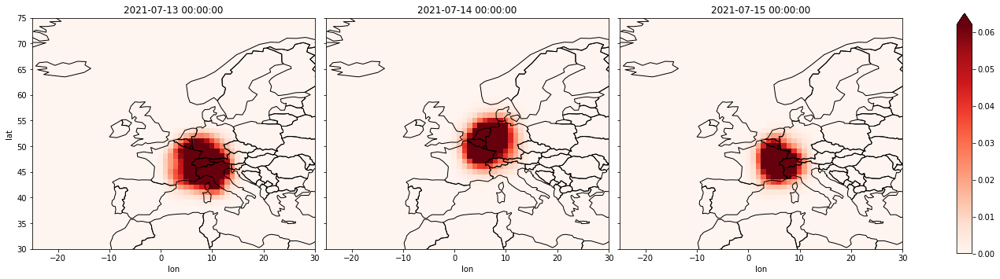

In [43]:
m_unet1= xr.DataArray(rel_UNET1_2021_avg, dims=["time","lat", "lon"],
                  coords=dict(time=idates21, lat = lats_y, 
            lon = lons_x))
g = m_unet1.plot.pcolormesh("lon", "lat", col="time", col_wrap=3, robust=True, cmap='Reds',
    yincrease = False, extend='max',figsize=(20, 8),  cbar_kwargs={"orientation": "vertical","shrink": 0.6,"aspect": 15})
    #figsize=(14, 12)
for ax, title in zip(g.axes.flat, idates21):
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    world.boundary.plot(ax=ax, lw=1, color='k')
    ax.set_xlim(min(lons_x), max(lons_x))
    ax.set_title(title)
    ax.set_ylim(min(lats_y), max(lats_y))
plt.savefig('figures/episode__Unet1_lprcomp_2021_storms.pdf')

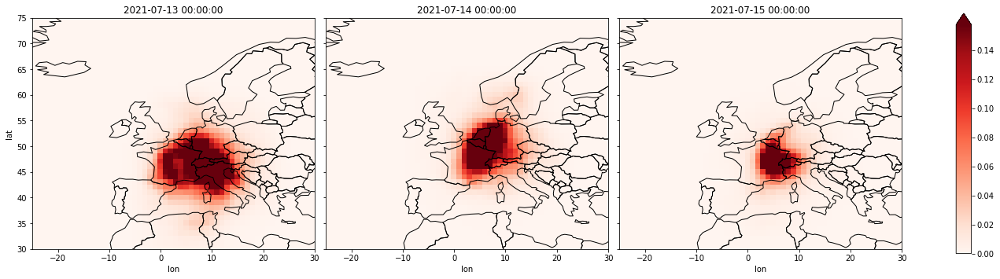

In [44]:
m_unet2= xr.DataArray(rel_UNET2_2021_avg, dims=["time","lat", "lon"],
                  coords=dict(time=idates21, lat = lats_y, 
            lon = lons_x))
g = m_unet2.plot.pcolormesh("lon", "lat", col="time", col_wrap=3, robust=True, cmap='Reds',
    yincrease = False, extend='max',figsize=(20, 8),  cbar_kwargs={"orientation": "vertical","shrink": 0.6,"aspect": 15})
    #figsize=(14, 12)
for ax, title in zip(g.axes.flat, idates21):
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    world.boundary.plot(ax=ax, lw=1, color='k')
    ax.set_xlim(min(lons_x), max(lons_x))
    ax.set_title(title)
    ax.set_ylim(min(lats_y), max(lats_y))
plt.savefig('figures/episode__Unet2_lprcomp_2021_storms.pdf')

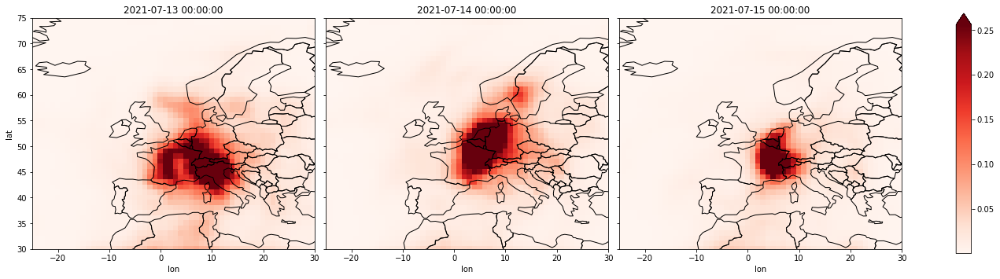

In [45]:
m_unet3= xr.DataArray(rel_UNET3_2021_avg, dims=["time","lat", "lon"],
                  coords=dict(time=idates21, lat = lats_y, 
            lon = lons_x))
g = m_unet3.plot.pcolormesh("lon", "lat", col="time", col_wrap=3, robust=True, cmap='Reds',
    yincrease = False, extend='max',figsize=(20, 8),  cbar_kwargs={"orientation": "vertical","shrink": 0.6,"aspect": 15})
    #figsize=(14, 12)
for ax, title in zip(g.axes.flat, idates21):
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    world.boundary.plot(ax=ax, lw=1, color='k')
    ax.set_xlim(min(lons_x), max(lons_x))
    ax.set_title(title)
    ax.set_ylim(min(lats_y), max(lats_y))
plt.savefig('figures/episode__Unet3_lprcomp_2021_storms.pdf')

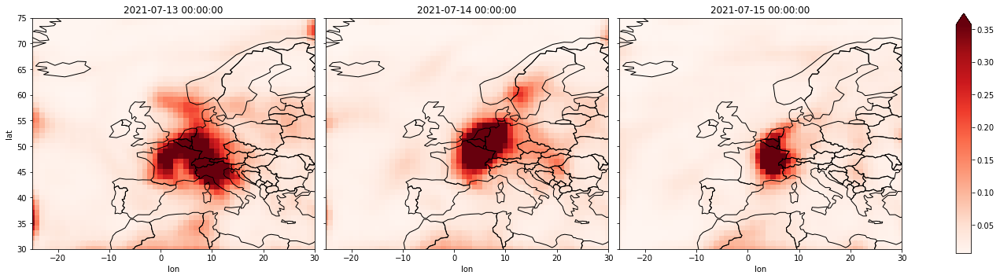

In [46]:
m_unet4= xr.DataArray(rel_UNET4_2021_avg, dims=["time","lat", "lon"],
                  coords=dict(time=idates21, lat = lats_y, 
            lon = lons_x))
g = m_unet4.plot.pcolormesh("lon", "lat", col="time", col_wrap=3, robust=True, cmap='Reds',
    yincrease = False, extend='max',figsize=(20, 8),  cbar_kwargs={"orientation": "vertical","shrink": 0.6,"aspect": 15})
    #figsize=(14, 12)
for ax, title in zip(g.axes.flat, idates21):
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    world.boundary.plot(ax=ax, lw=1, color='k')
    ax.set_xlim(min(lons_x), max(lons_x))
    ax.set_title(title)
    ax.set_ylim(min(lats_y), max(lats_y))
plt.savefig('figures/episode__Unet4_lprcomp_2021_storms.pdf')

### Analyse baselines

In [67]:
# 1. Zeros

In [61]:
baseline0_rel_lrpcomp_UNET1_2021= calLRP(dg_test_X_zeros[idx-1:idx+2,:,:,:],models_prec[0].model, 'comp', only_positive=False )
baseline0_rel_lrpcomp_UNET2_2021= calLRP(dg_test_X_zeros[idx-1:idx+2,:,:,:],models_prec[1].model, 'comp', only_positive=False )
baseline0_rel_lrpcomp_UNET3_2021= calLRP(dg_test_X_zeros[idx-1:idx+2,:,:,:],models_prec[2].model, 'comp', only_positive=False )
baseline0_rel_lrpcomp_UNET4_2021= calLRP(dg_test_X_zeros[idx-1:idx+2,:,:,:],models_prec[3].model, 'comp', only_positive=False )

In [66]:
baseline0_rel_lrpcomp_UNET1_2021.max()

0.0

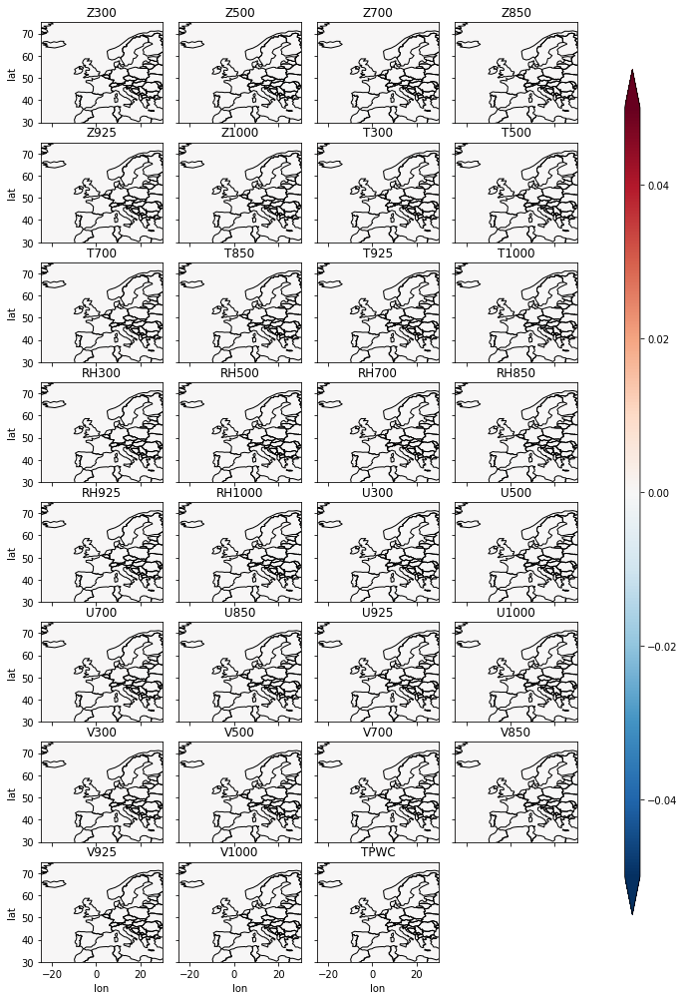

In [63]:
plot_xr_rel(baseline0_rel_lrpcomp_UNET1_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'baseline_zero_lrpcomp_UNET1_2021', vmin=None, vmax = None, cmap = 'RdBu_r')

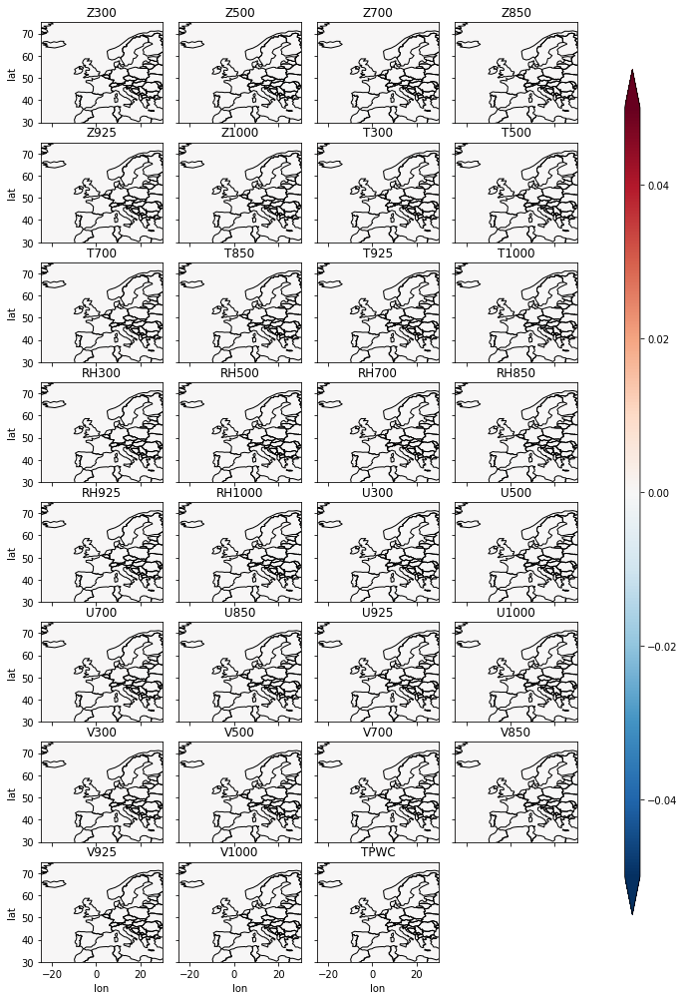

In [65]:
plot_xr_rel(baseline0_rel_lrpcomp_UNET2_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'baseline_zero_lrpcomp_UNET2_2021', vmin=None, vmax = None, cmap = 'RdBu_r')

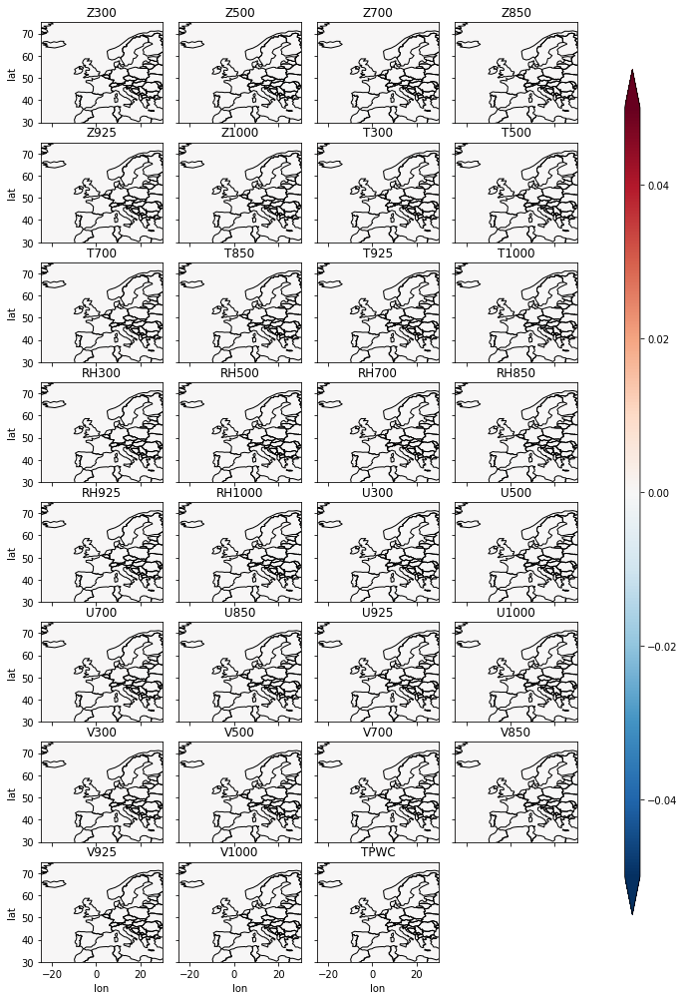

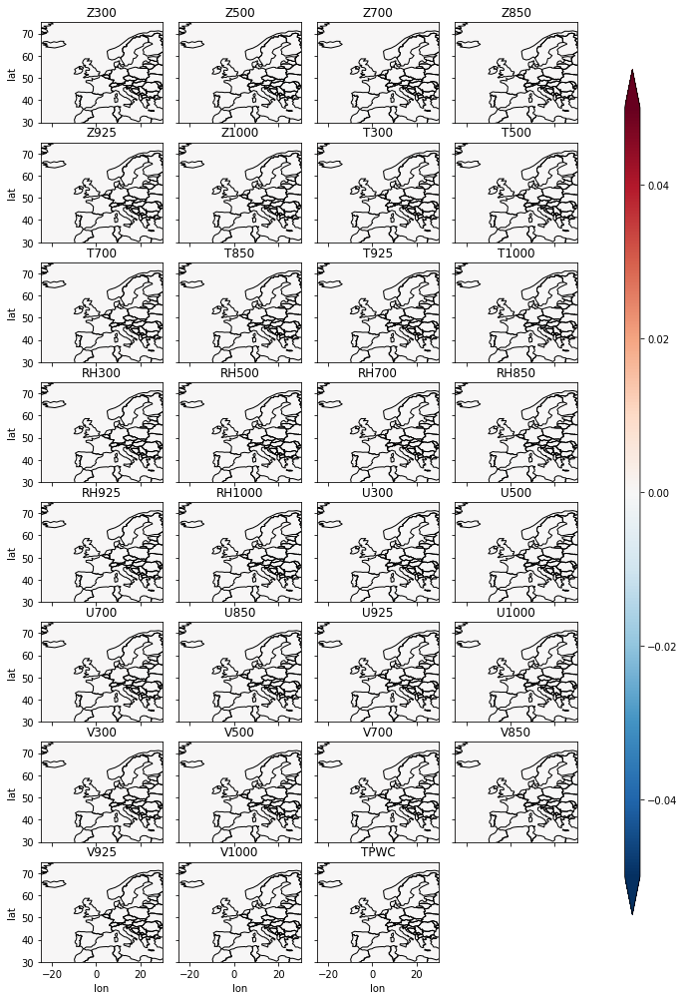

In [64]:
plot_xr_rel(baseline0_rel_lrpcomp_UNET3_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'baseline_zero_lrpcomp_UNET3_2021', vmin=None, vmax = None, cmap = 'RdBu_r')
plot_xr_rel(baseline0_rel_lrpcomp_UNET4_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'baseline_zero_lrpcomp_UNET4_2021', vmin=None, vmax = None, cmap = 'RdBu_r')

In [ ]:
# Note: when passing all zeros the LRP return zero, so in this case we need to use another baseline
dg_test_X_05 = np.ones_like(dg_test_X, dtype=float)*0.5
dg_test_X_one = np.ones_like(dg_test_X, dtype=float)

In [50]:
baseline_rel_lrpcomp_UNET1_2021= calLRP(dg_test_X_one[idx-1:idx+2,:,:,:],models_prec[0].model, 'comp', only_positive=False )
baseline_rel_lrpcomp_UNET2_2021= calLRP(dg_test_X_one[idx-1:idx+2,:,:,:],models_prec[1].model, 'comp', only_positive=False )
baseline_rel_lrpcomp_UNET3_2021= calLRP(dg_test_X_one[idx-1:idx+2,:,:,:],models_prec[2].model, 'comp', only_positive=False )
baseline_rel_lrpcomp_UNET4_2021= calLRP(dg_test_X_one[idx-1:idx+2,:,:,:],models_prec[3].model, 'comp', only_positive=False )

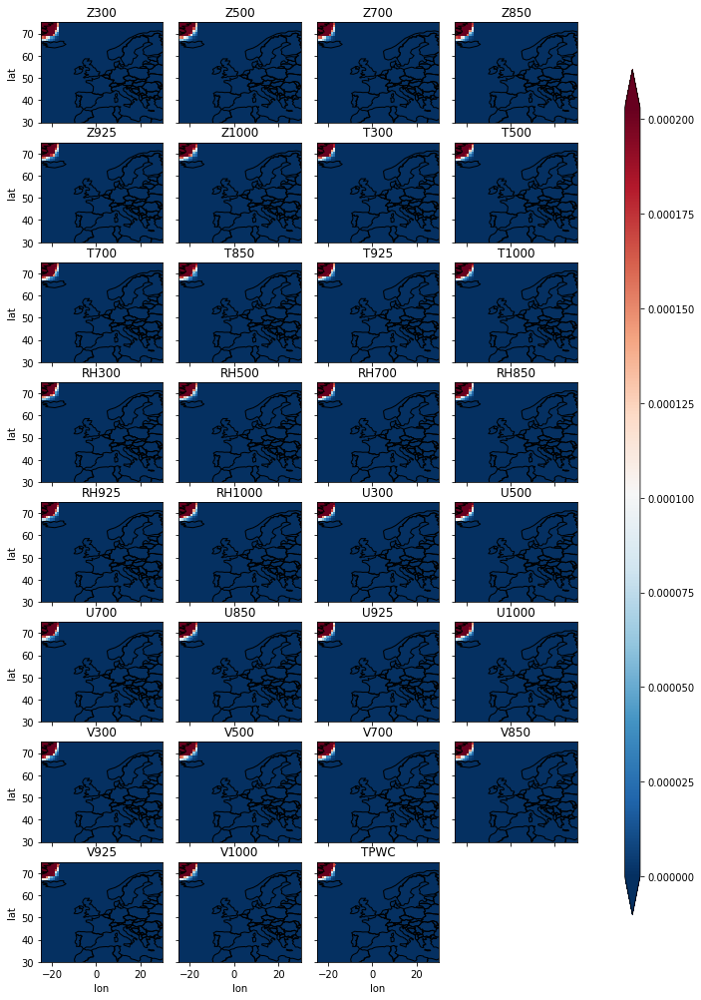

In [51]:
plot_xr_rel(baseline_rel_lrpcomp_UNET1_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'baseline_one_lrpcomp_UNET1_2021', vmin=None, vmax = None, cmap = 'RdBu_r')

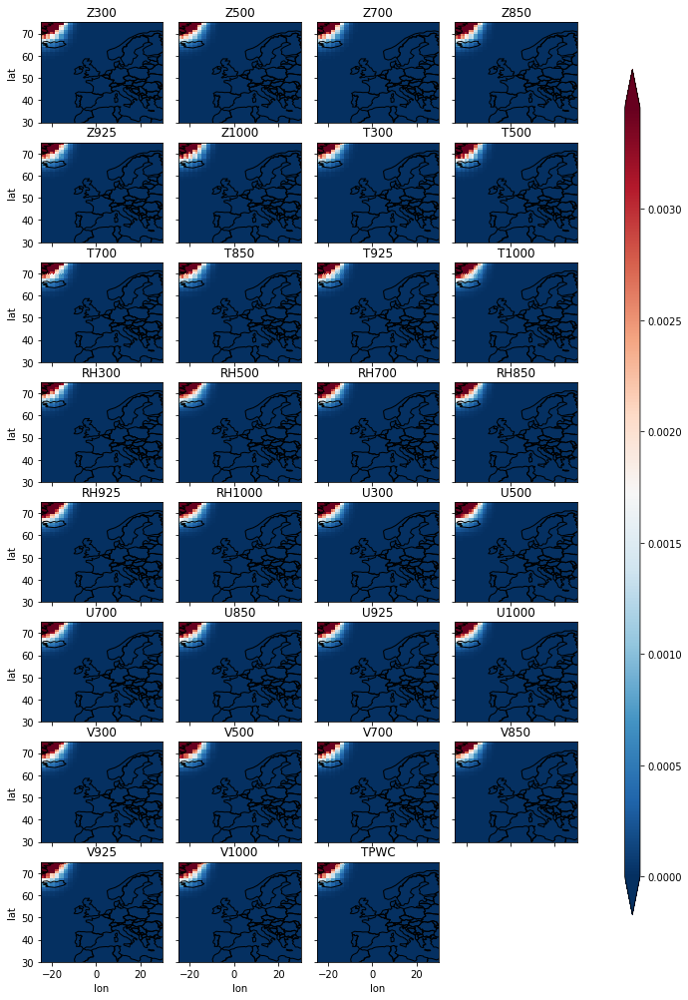

In [52]:
plot_xr_rel(baseline_rel_lrpcomp_UNET2_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'baseline_one_lrpcomp_UNET2_2021', vmin=None, vmax = None, cmap = 'RdBu_r')

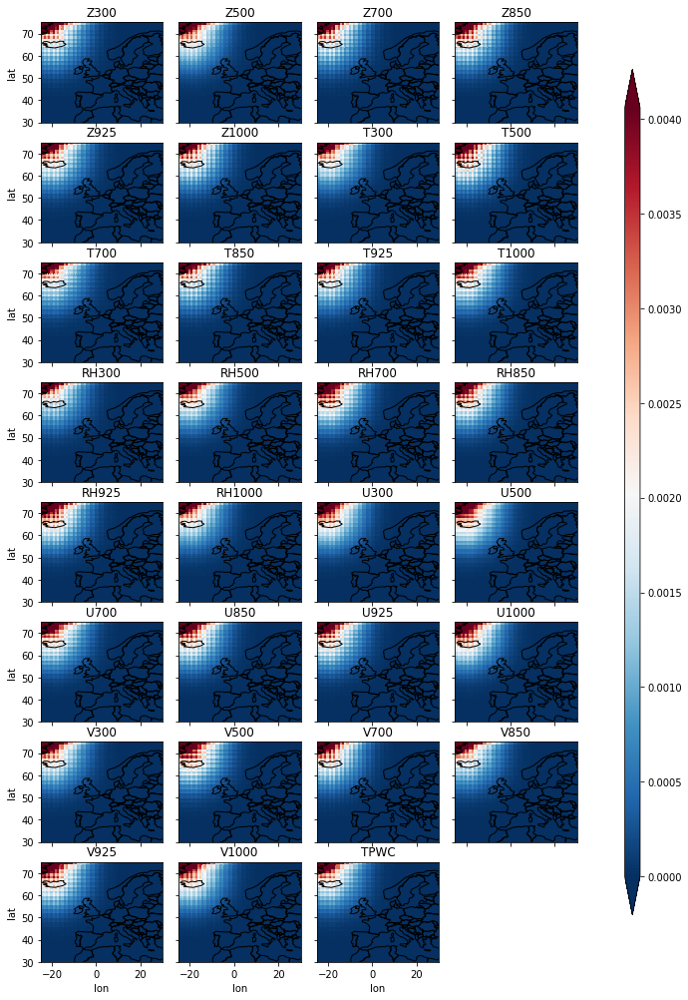

In [53]:
plot_xr_rel(baseline_rel_lrpcomp_UNET3_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'baseline_one_lrpcomp_UNET3_2021', vmin=None, vmax = None, cmap = 'RdBu_r')

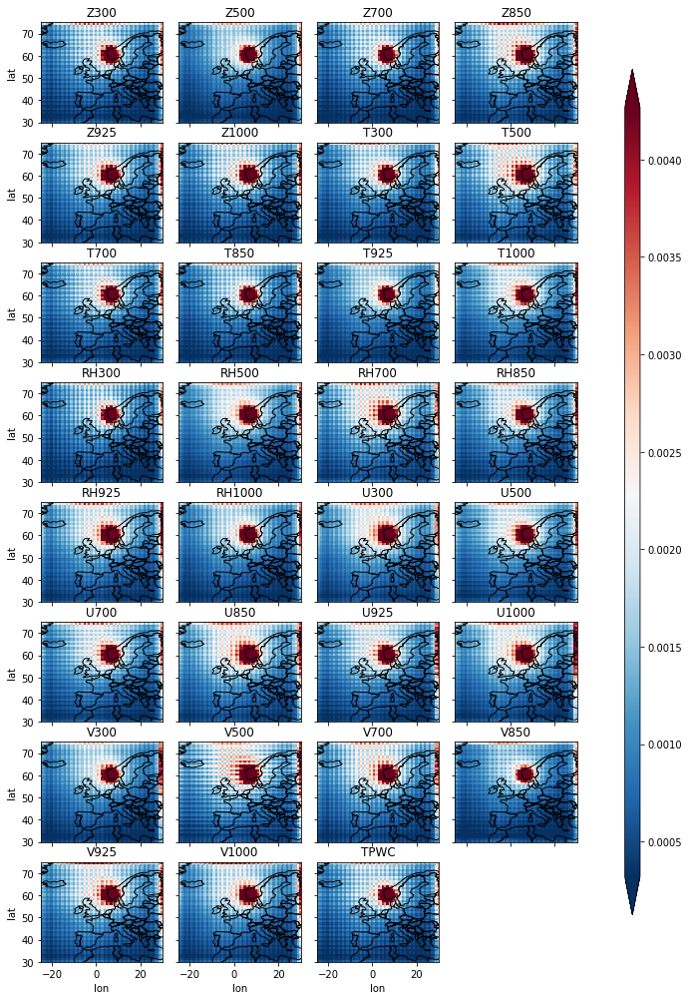

In [54]:
plot_xr_rel(baseline_rel_lrpcomp_UNET4_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'baseline_one_lrpcomp_UNET4_2021', vmin=None, vmax = None, cmap = 'RdBu_r')

In [55]:
baseline_rel_UNET1_2021= calLRP(dg_test_X_one[idx-1:idx+2,:,:,:],models_prec[0].model, 'lrpz', only_positive=False )
baseline_rel_UNET2_2021= calLRP(dg_test_X_one[idx-1:idx+2,:,:,:],models_prec[1].model, 'lrpz', only_positive=False )
baseline_rel_UNET3_2021= calLRP(dg_test_X_one[idx-1:idx+2,:,:,:],models_prec[2].model, 'lrpz', only_positive=False )
baseline_rel_UNET4_2021= calLRP(dg_test_X_one[idx-1:idx+2,:,:,:],models_prec[3].model, 'lrpz', only_positive=False )

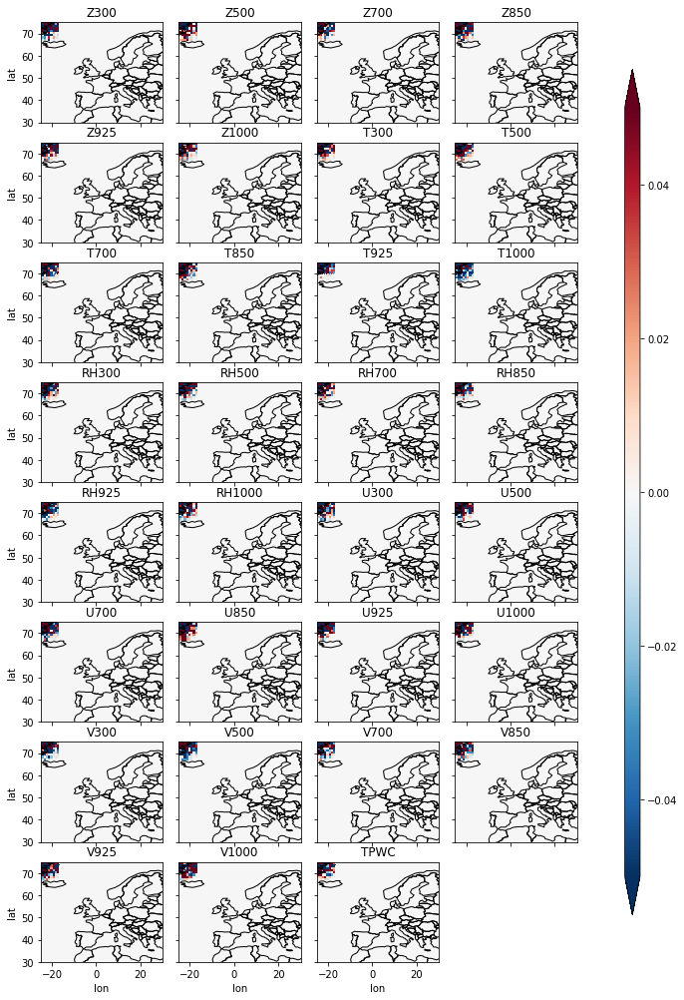

In [56]:
plot_xr_rel(baseline_rel_UNET1_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'baseline_one_rel_lrpz_UNET1_2021', vmin=None, vmax = None, cmap = 'RdBu_r')

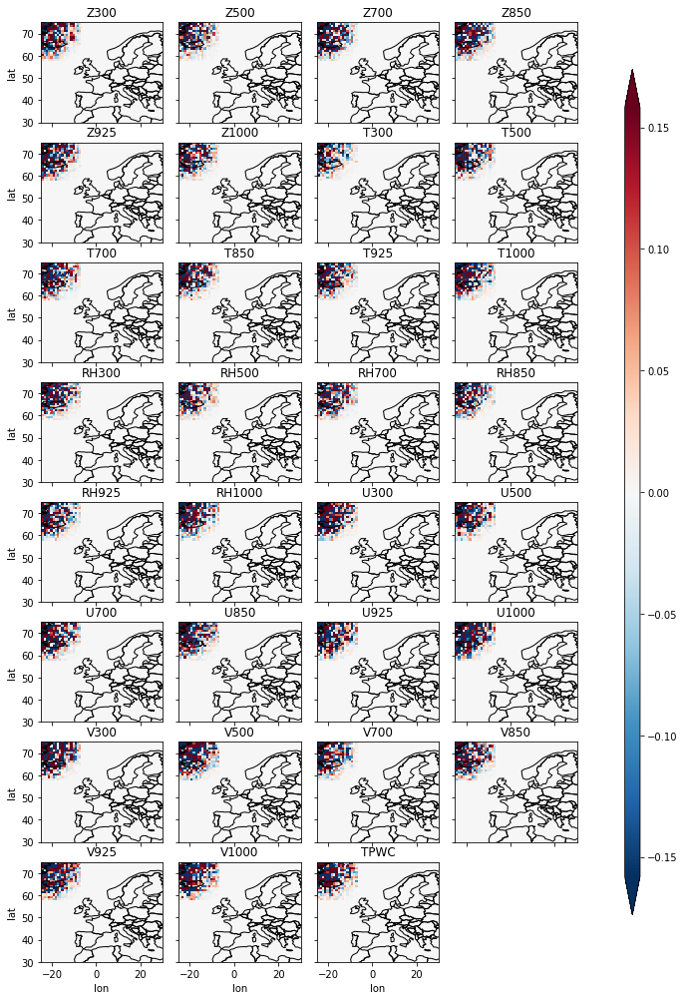

In [57]:
plot_xr_rel(baseline_rel_UNET2_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'baseline_one_rel_lrpz_UNET2_2021', vmin=None, vmax = None, cmap = 'RdBu_r')

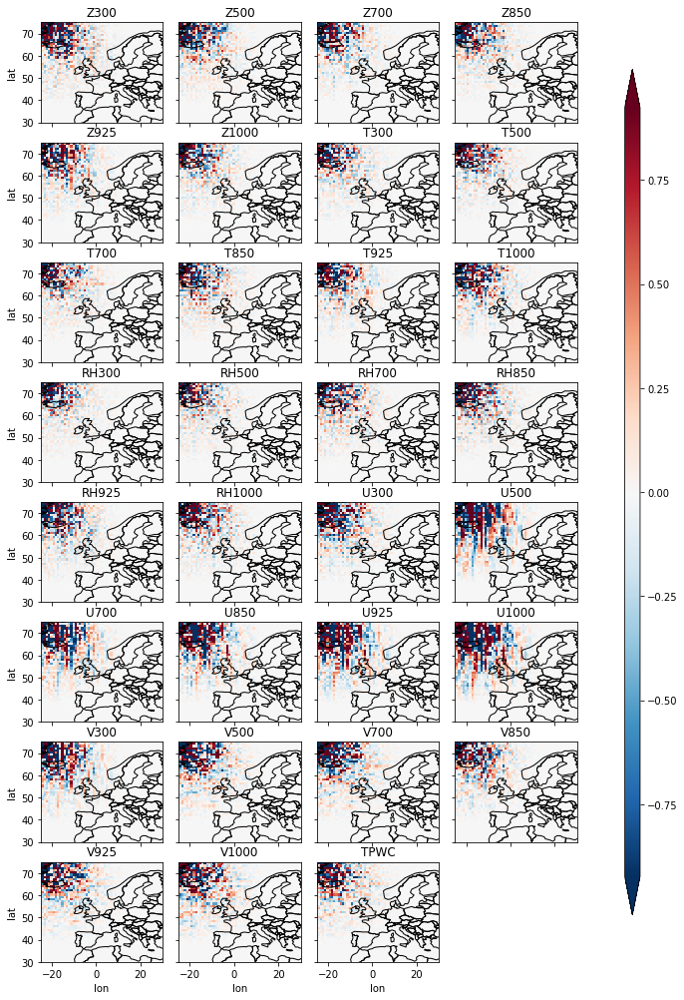

In [58]:
plot_xr_rel(baseline_rel_UNET3_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'baseline_one_rel_lrpz_UNET3_2021', vmin=None, vmax = None, cmap = 'RdBu_r')

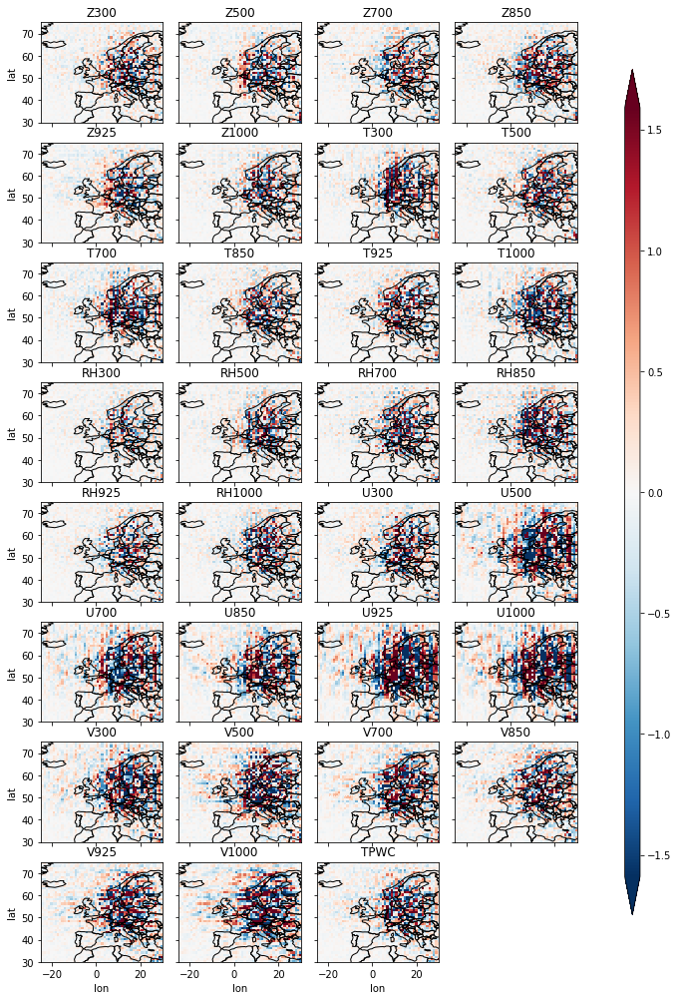

In [59]:
plot_xr_rel(baseline_rel_UNET4_2021[1,:,:,:], lats_y, lons_x, conf['varnames'], 'baseline_one_rel_lrpz_UNET4_2021', vmin=None, vmax = None, cmap = 'RdBu_r')